<a href="https://colab.research.google.com/github/TWmin13/image-processing-app/blob/main/app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # for image display as colab
import pylab  # this allows you to control figure size
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.1 MB/s eta 0:00:00


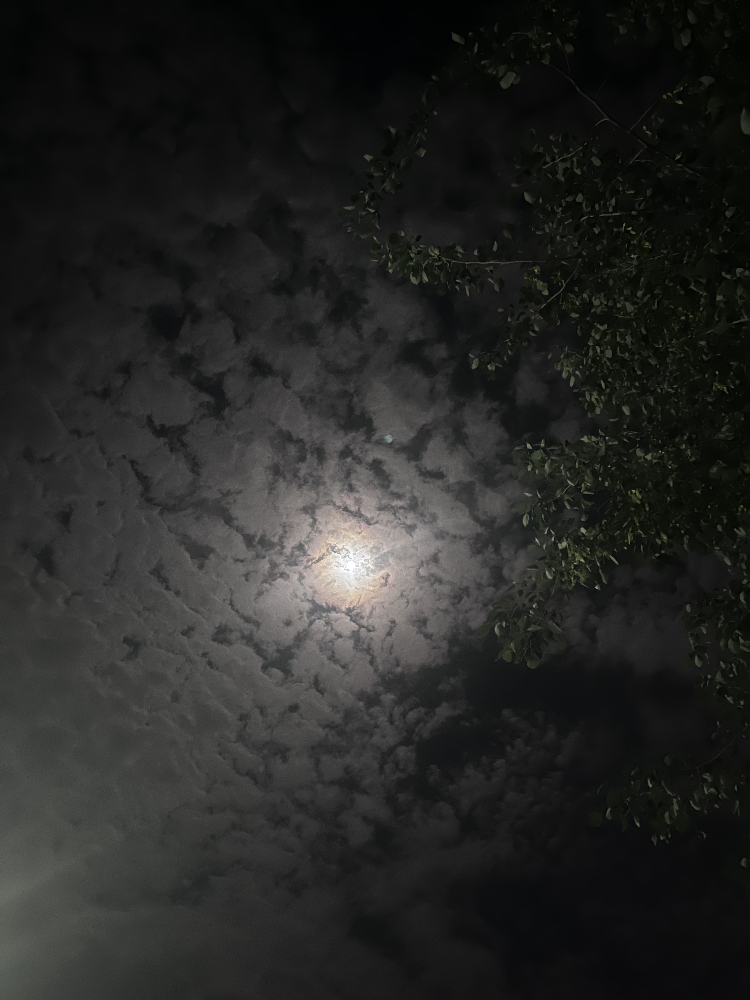

In [2]:
!pip install pillow-heif
from pillow_heif import open_heif
from PIL import Image
import cv2
import numpy as np

# Open HEIC image and convert to PIL image
heif_file = open_heif("/content/IMG_4254.HEIC")
image = Image.frombytes(heif_file.mode, heif_file.size, heif_file.data)

# Convert to OpenCV format (numpy array)
image_cv = np.array(image)
image_cv = cv2.cvtColor(image_cv, cv2.COLOR_RGB2BGR)  # Convert RGB to BGR for OpenCV

# Display the image
from google.colab.patches import cv2_imshow
cv2_imshow(image_cv)


In [3]:
print(image_cv.dtype)
print(image_cv.shape[0])
print(image_cv.shape[1])
print(image_cv.shape[2])
print(image_cv[1,33]) #R G B value

uint8
4032
3024
3
[7 8 6]


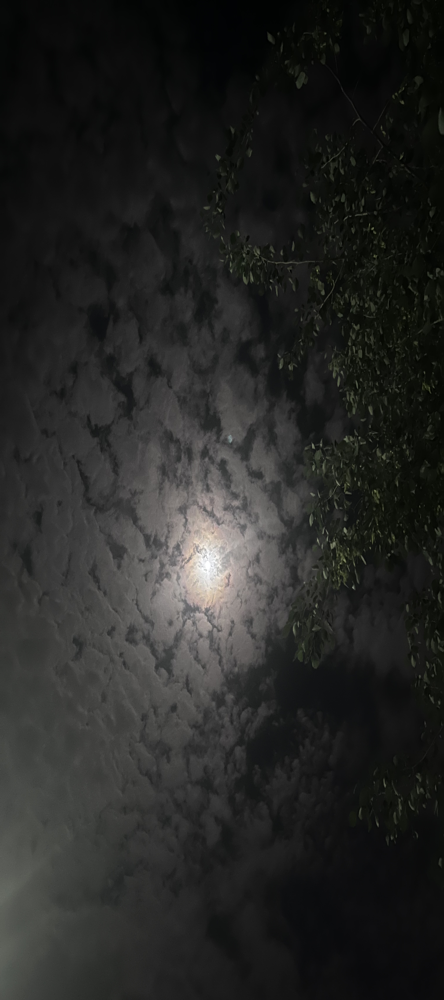

In [4]:
resized_image = cv2.resize(image_cv, (image_cv.shape[0]*25//100, image_cv.shape[1]*75//100))
cv2_imshow(resized_image)

In [5]:
random_array = np.random.randint(0, 256, size=(200, 200), dtype=np.uint8)
print(random_array)

[[ 59 238  66 ... 181  44  15]
 [ 70  40 123 ...  96  59 254]
 [123 225 190 ... 214  35  41]
 ...
 [238 214 109 ...   0 156 215]
 [ 65  20  24 ... 131 168  51]
 [ 92 174  51 ...  28  34 190]]


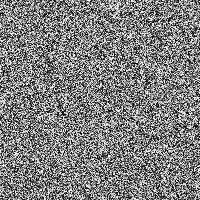

In [6]:
cv2_imshow(random_array)

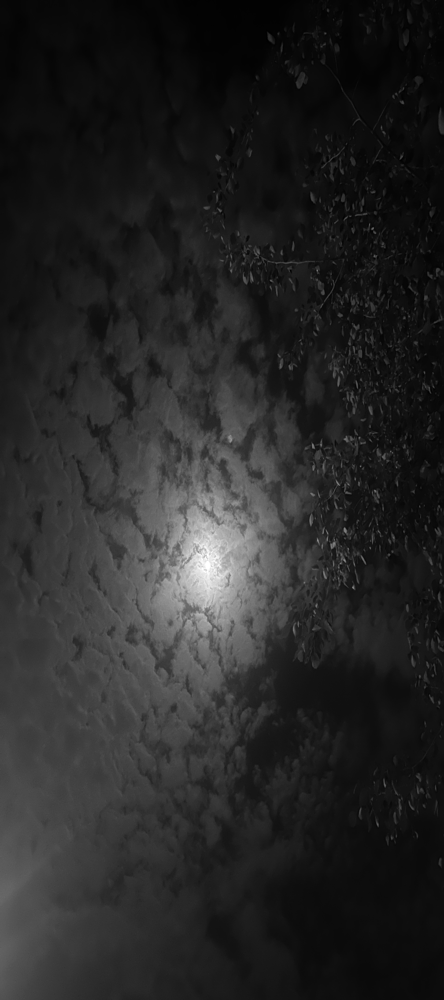

In [7]:
gray_image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [8]:
print(gray_image[1,33])

6


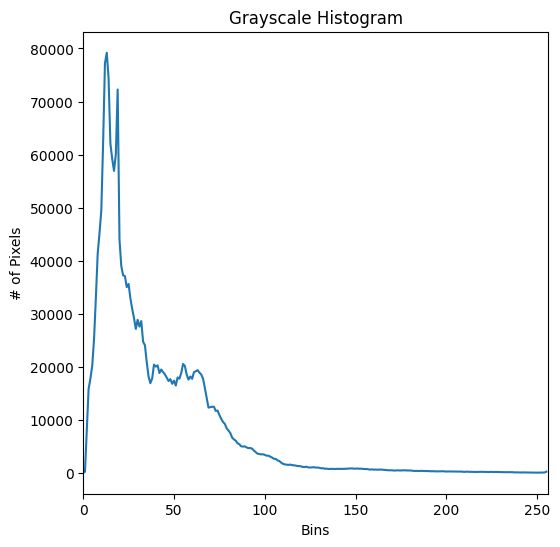

In [10]:
def plot_histogram(image_cv,str):
  hist = cv2.calcHist([image_cv],[0],None,[256],[0,256])
  # initializes a new figure object where you can add plots, titles, labels, and other elements.
  plt.figure(figsize=(6,6),dpi=100)
  # title of figure
  plt.title(str)
  # label x-axis
  plt.xlabel("Bins")
  # label y-axis
  plt.ylabel("# of Pixels")
  # plot histogram on figure
  plt.plot(hist)
  # set range of x-axis
  plt.xlim([0, 256])
  # display plot
  plt.show()
plot_histogram(image_cv=gray_image,str="Grayscale Histogram")

[[[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 3  8  6]
  [ 4  9  7]
  [ 4  9  7]]

 [[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 4  9  7]
  [ 4  9  7]
  [ 4  9  7]]

 [[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 3  8  6]
  [ 4  9  7]
  [ 4  9  7]]

 ...

 [[78 83 81]
  [76 81 79]
  [77 82 80]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 [[80 83 81]
  [78 81 79]
  [79 82 80]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[79 82 80]
  [78 81 79]
  [79 82 80]
  ...
  [12 12 12]
  [12 12 12]
  [13 13 13]]]
[[[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 3  8  6]
  [ 4  9  7]
  [ 4  9  7]]

 [[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 4  9  7]
  [ 4  9  7]
  [ 4  9  7]]

 [[ 7  8  6]
  [ 7  8  6]
  [ 7  8  6]
  ...
  [ 3  8  6]
  [ 4  9  7]
  [ 4  9  7]]

 ...

 [[78 83 81]
  [76 81 79]
  [77 82 80]
  ...
  [12 12 12]
  [11 11 11]
  [11 11 11]]

 [[80 83 81]
  [78 81 79]
  [79 82 80]
  ...
  [12 12 12]
  [12 12 12]
  [12 12 12]]

 [[79 82 80]
  [78 81 79]
  [79 82 80]
  .

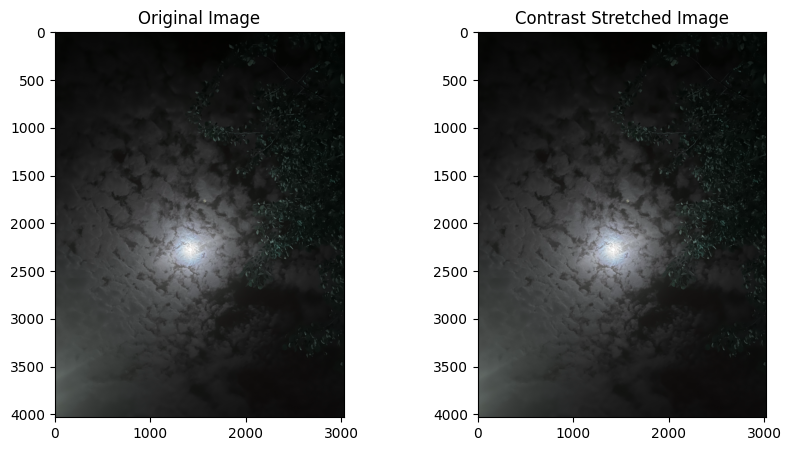

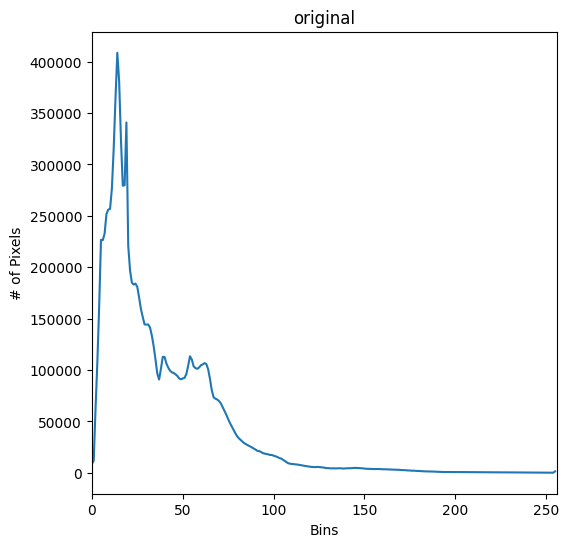

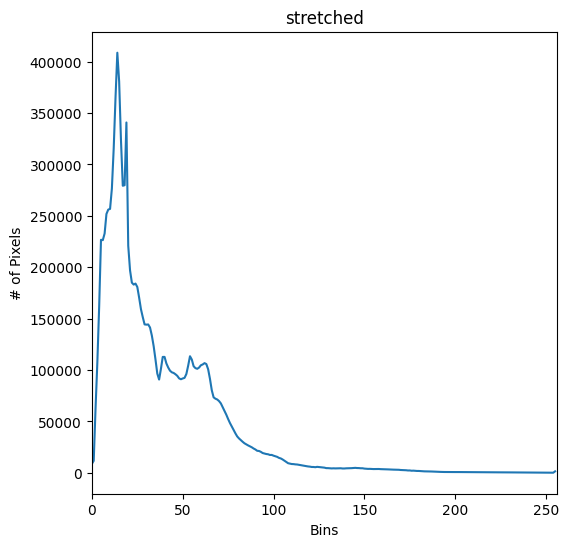

In [12]:
def contrast_stretching(image_cv):
    # Find the minimum and maximum pixel values
    r_min, r_max = np.min(image_cv), np.max(image_cv)
    print(image_cv)
    # Apply contrast stretching
    stretched_img = ((image_cv - r_min) / (r_max - r_min) * 255).astype(np.uint8)
    print(stretched_img)
    # Display the original and stretched images for comparison
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image_cv, cmap='gray')

    plt.subplot(1, 2, 2)
    plt.title('Contrast Stretched Image')
    plt.imshow(stretched_img, cmap='gray')

    plt.show()

    plot_histogram(image_cv,"original")
    plot_histogram(stretched_img,"stretched")

stretched = contrast_stretching(image_cv)


Loaded HEIC image successfully: /content/IMG_4254.HEIC


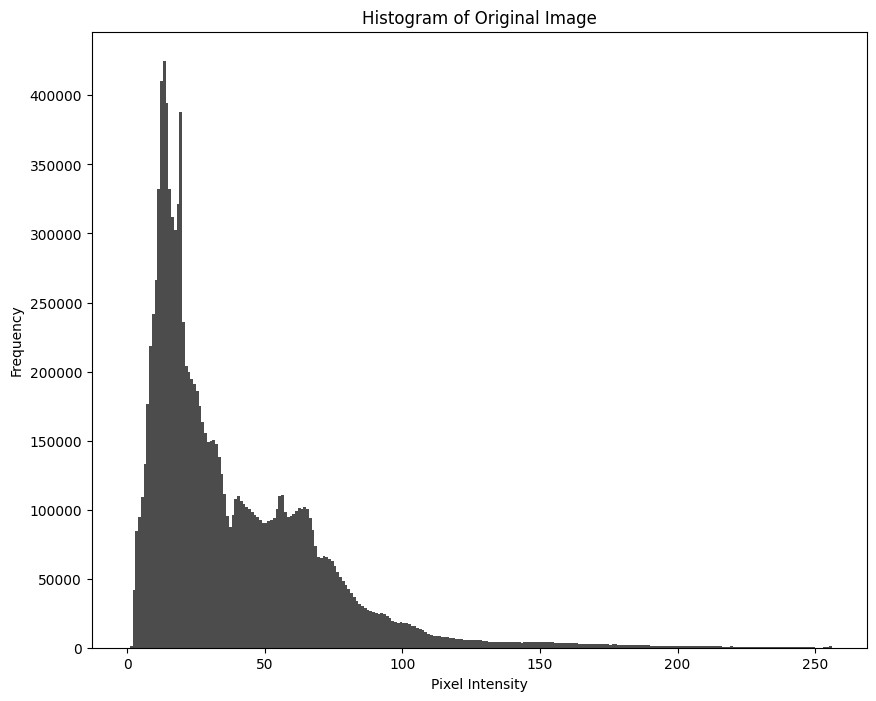

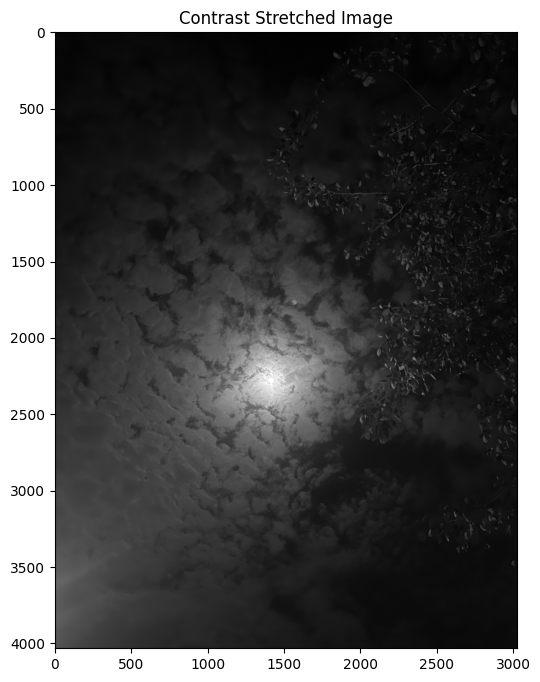

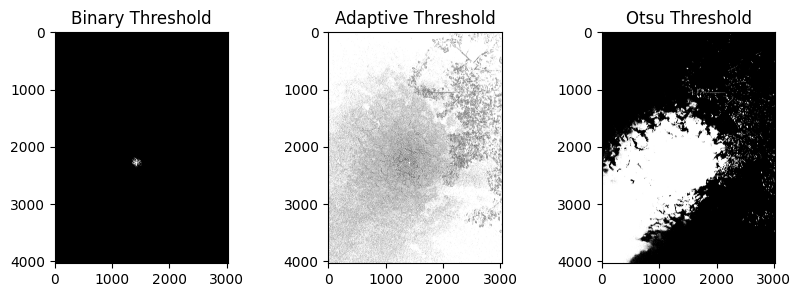

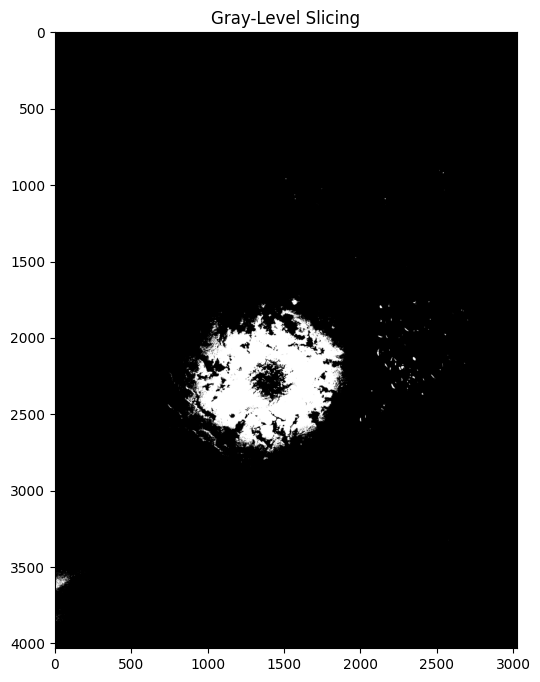

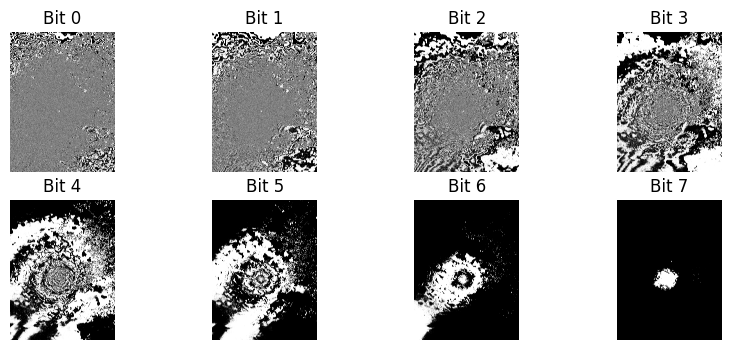

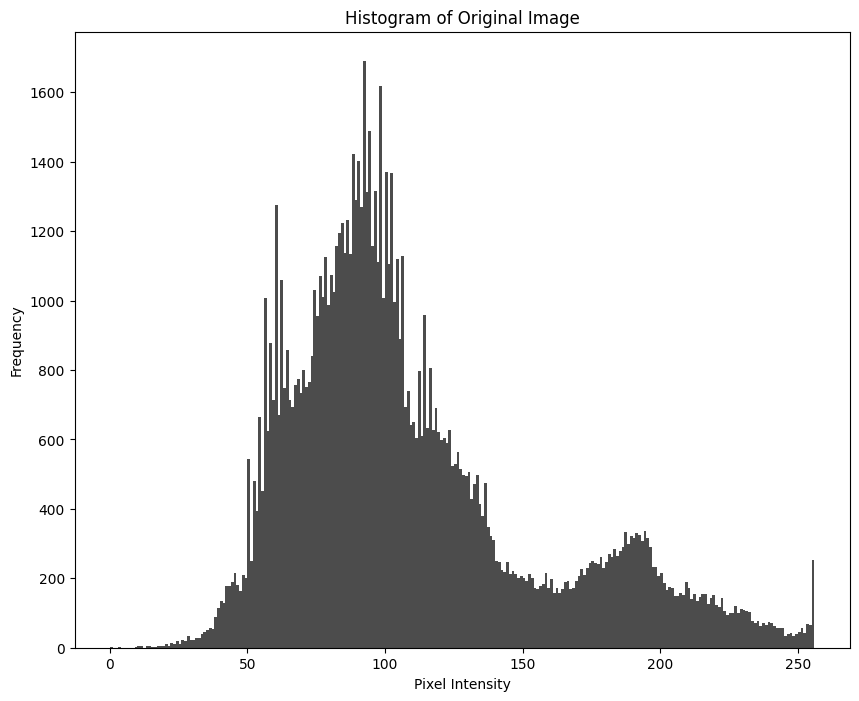

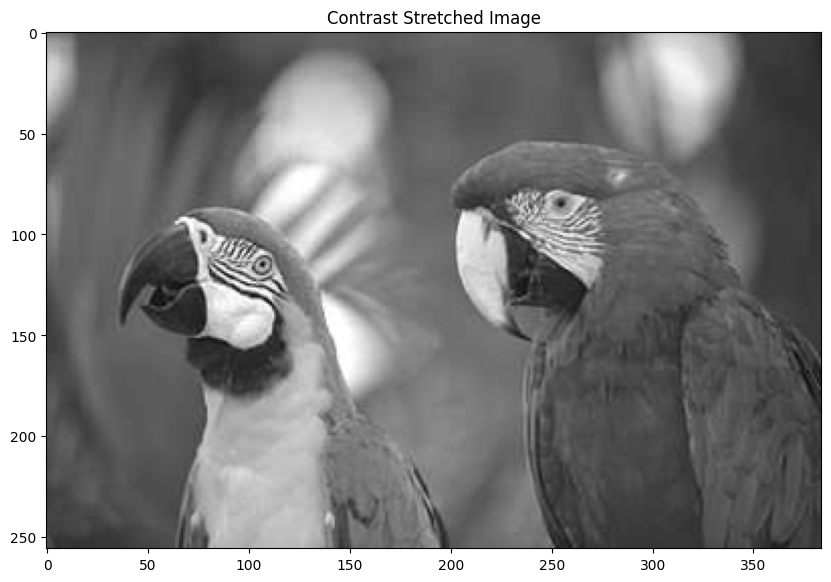

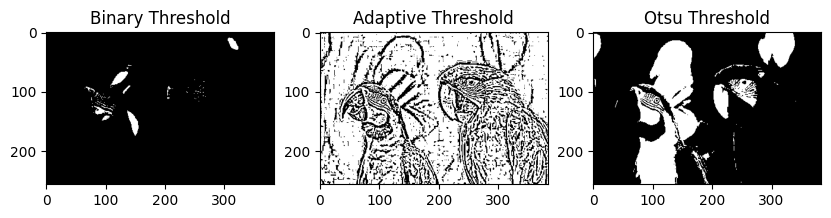

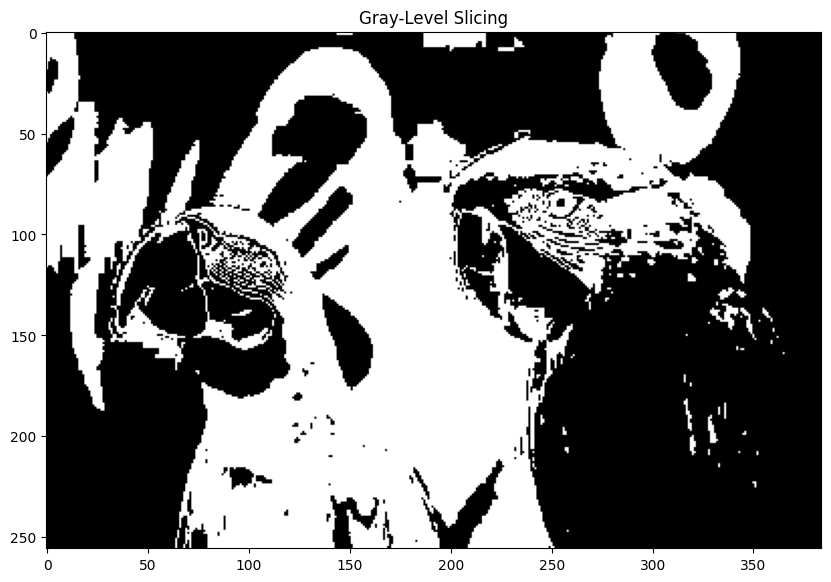

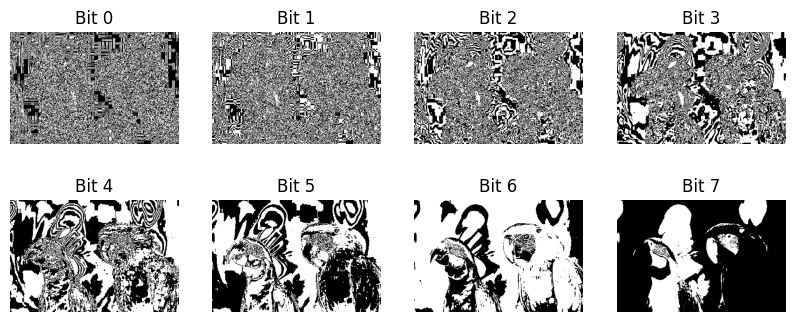

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# If HEIC images are used, install and import pillow-heif
try:
    from PIL import Image
    import pillow_heif
    HEIC_SUPPORT = True
except ImportError:
    HEIC_SUPPORT = False
    print("HEIC support not available. Install pillow-heif using 'pip install pillow-heif'.")

# Function to plot histogram
def plot_histogram(image_cv, title):
    plt.figure()
    plt.hist(image_cv.ravel(), bins=256, range=[0, 256], color='black', alpha=0.7)
    plt.title(f'Histogram of {title}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

# Function to perform contrast stretching
def contrast_stretching(image_cv):
    r_min, r_max = np.min(image_cv), np.max(image_cv)
    stretched_img = ((image_cv - r_min) / (r_max - r_min) * 255).astype(np.uint8)
    return stretched_img

# Function to perform thresholding
def apply_thresholding(image_cv):
    _, binary = cv2.threshold(image_cv, 233, 255, cv2.THRESH_BINARY)
    adaptive = cv2.adaptiveThreshold(image_cv, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    _, otsu = cv2.threshold(image_cv, 17, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.title("Binary Threshold")
    plt.imshow(binary, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title("Adaptive Threshold")
    plt.imshow(adaptive, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title("Otsu Threshold")
    plt.imshow(otsu, cmap='gray')

    plt.show()

# Function to perform gray-level slicing
def gray_level_slicing(image_cv, min_range=100, max_range=200):
    sliced = np.where((image_cv >= min_range) & (image_cv <= max_range), 255, 0).astype(np.uint8)
    return sliced

# Function to perform bit plane slicing
def bit_plane_slicing(image_cv):
    plt.figure(figsize=(10, 4))
    for i in range(8):
        bit_plane = (image_cv & (1 << i)) >> i
        plt.subplot(2, 4, i+1)
        plt.title(f'Bit {i}')
        plt.imshow(bit_plane * 255, cmap='gray')
        plt.axis('off')
    plt.show()

# Function to read an image, handling HEIC format if necessary
def load_image(path):
    image_cv = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    # If OpenCV fails and HEIC support is available, try using pillow-heif
    if image_cv is None and HEIC_SUPPORT and path.lower().endswith(".heic"):
        try:
            heif_file = pillow_heif.open_heif(path)
            image_pil = Image.frombytes(heif_file.mode, heif_file.size, heif_file.data)
            image_cv = np.array(image_pil.convert("L"))  # Convert to grayscale
            print(f"Loaded HEIC image successfully: {path}")
        except Exception as e:
            print(f"Failed to load HEIC image: {path}, Error: {e}")

    if image_cv is None:
        print(f"Error: Could not load image from {path}")

    return image_cv

# List of image paths (Replace these with actual paths)
image_paths = [
    "/content/IMG_4254.HEIC",
    "/content/en_jqt.jpg"
]

# Process each image
for path in image_paths:
    if not os.path.exists(path):
        print(f"File not found: {path}")
        continue  # Skip if file does not exist

    image_cv = load_image(path)

    if image_cv is None:
        continue  # Skip if the image couldn't be loaded

    # Plot histogram of the original image
    plot_histogram(image_cv, "Original Image")

    # Contrast Stretching
    stretched = contrast_stretching(image_cv)
    plt.figure()
    plt.imshow(stretched, cmap='gray')
    plt.title('Contrast Stretched Image')
    plt.show()

    # Perform Thresholding
    apply_thresholding(stretched)

    # Perform Gray-Level Slicing
    gray_sliced = gray_level_slicing(stretched)
    plt.figure()
    plt.imshow(gray_sliced, cmap='gray')
    plt.title('Gray-Level Slicing')
    plt.show()

    # Perform Bit-Plane Slicing
    bit_plane_slicing(stretched)


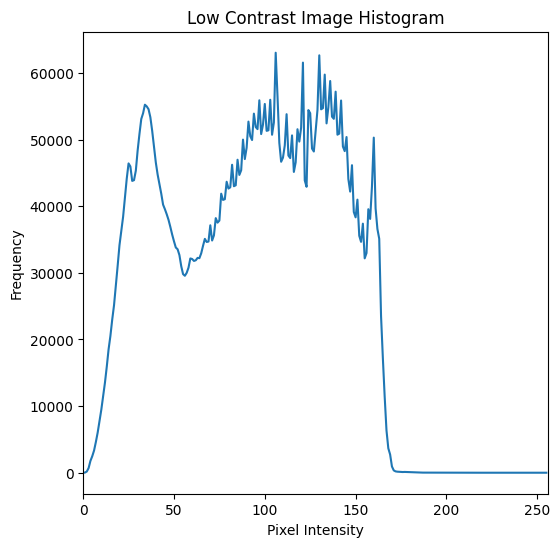

In [15]:
import cv2
import matplotlib.pyplot as plt

def plot_histogram(image_path, title):
    # Read the image in grayscale mode
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded properly
    if image is None:
        print("Error: Could not load image.")
        return

    # Calculate histogram
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])

    # Plot histogram
    plt.figure(figsize=(6, 6), dpi=100)
    plt.title(title)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.show()

# Call the function with correct image path
plot_histogram("/content/photo-1569722177871-4ed8080b7151.jpeg", "Low Contrast Image Histogram")


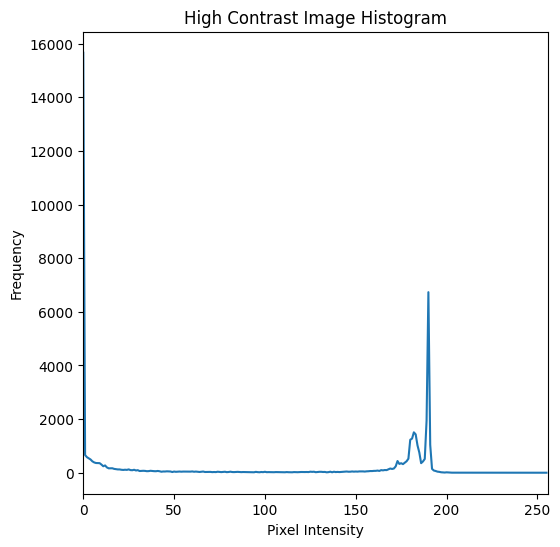

In [16]:
import cv2
import matplotlib.pyplot as plt

def plot_histogram(image_path, title):
    # Read the image in grayscale mode
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if image is loaded properly
    if image is None:
        print("Error: Could not load image.")
        return

    # Calculate histogram
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])

    # Plot histogram
    plt.figure(figsize=(6, 6), dpi=100)
    plt.title(title)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.show()

# Call the function with correct image path
plot_histogram("/content/images.jpeg", "High Contrast Image Histogram")


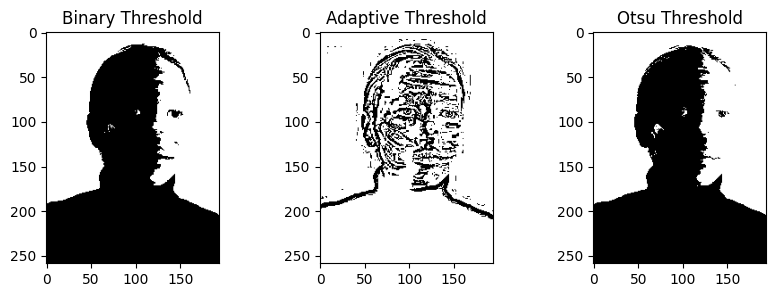

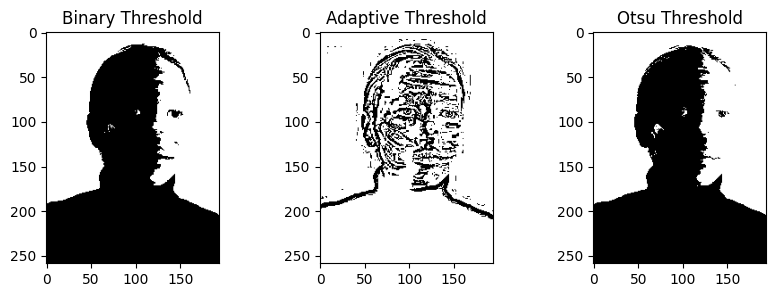

In [22]:
def apply_thresholding(image_cv):
    _, binary = cv2.threshold(image_cv, 127, 255, cv2.THRESH_BINARY)
    adaptive = cv2.adaptiveThreshold(image_cv, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    _, otsu = cv2.threshold(image_cv, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.title("Binary Threshold")
    plt.imshow(binary, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title("Adaptive Threshold")
    plt.imshow(adaptive, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title("Otsu Threshold")
    plt.imshow(otsu, cmap='gray')

    plt.show()
image_cv = load_image("/content/images.jpeg")
apply_thresholding(image_cv)

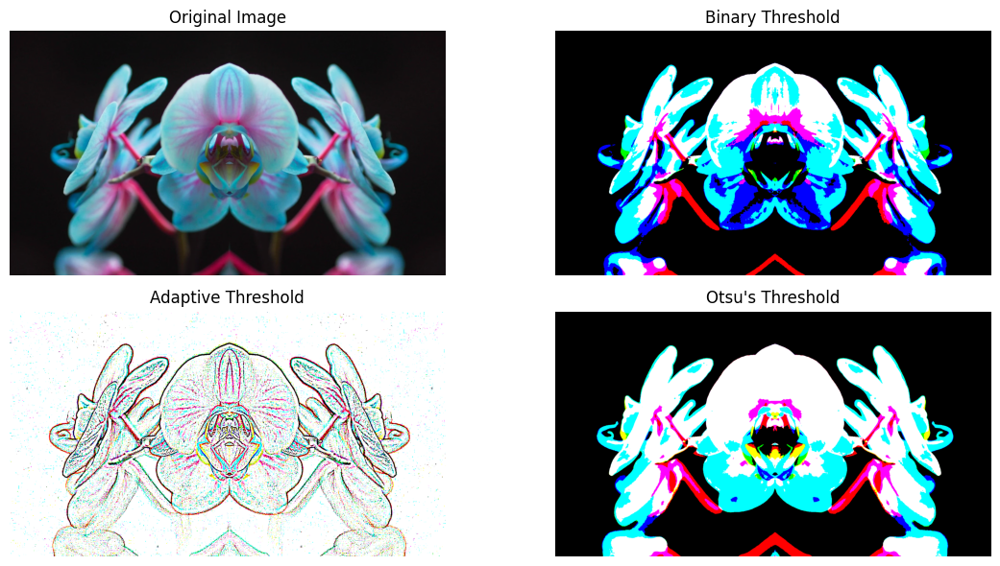

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_thresholding_color(image_cv):
    # Split the image into B, G, R channels
    b, g, r = cv2.split(image_cv)

    # Apply Binary Thresholding
    _, b_bin = cv2.threshold(b, 127, 255, cv2.THRESH_BINARY)
    _, g_bin = cv2.threshold(g, 127, 255, cv2.THRESH_BINARY)
    _, r_bin = cv2.threshold(r, 127, 255, cv2.THRESH_BINARY)
    binary_thresh = cv2.merge([b_bin, g_bin, r_bin])  # Merge channels back

    # Apply Adaptive Thresholding
    b_adaptive = cv2.adaptiveThreshold(b, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    g_adaptive = cv2.adaptiveThreshold(g, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    r_adaptive = cv2.adaptiveThreshold(r, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    adaptive_thresh = cv2.merge([b_adaptive, g_adaptive, r_adaptive])  # Merge channels back

    # Apply Otsu's Thresholding
    _, b_otsu = cv2.threshold(b, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, g_otsu = cv2.threshold(g, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, r_otsu = cv2.threshold(r, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    otsu_thresh = cv2.merge([b_otsu, g_otsu, r_otsu])  # Merge channels back

    # Plot the results
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 2)
    plt.title("Binary Threshold")
    plt.imshow(cv2.cvtColor(binary_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 3)
    plt.title("Adaptive Threshold")
    plt.imshow(cv2.cvtColor(adaptive_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 4)
    plt.title("Otsu's Threshold")
    plt.imshow(cv2.cvtColor(otsu_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Load the color image
image_cv = cv2.imread("/content/contrastingcolors.webp")  # Load as color (default)
apply_thresholding_color(image_cv)



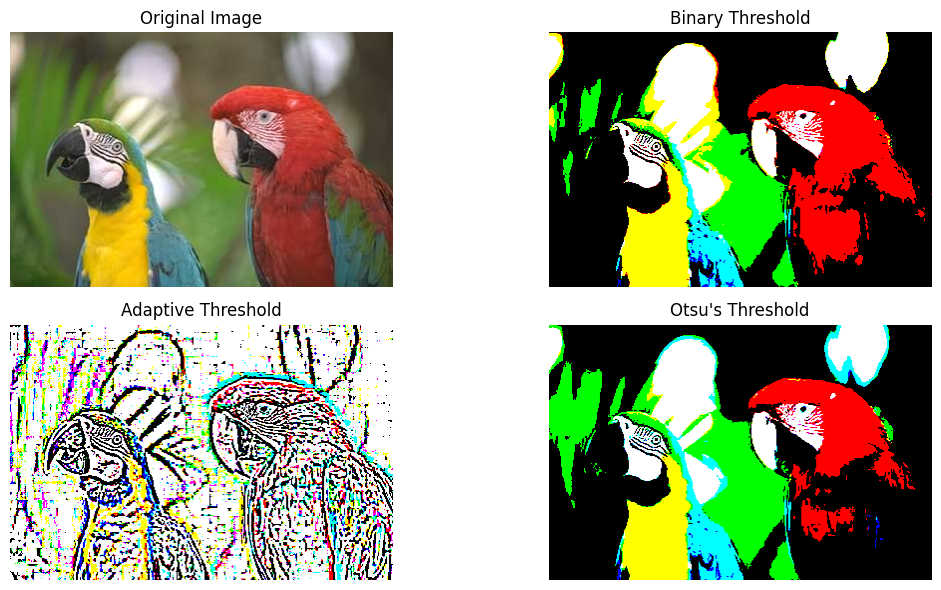

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_thresholding_color(image_cv):
    # Split the image into B, G, R channels
    b, g, r = cv2.split(image_cv)

    # Apply Binary Thresholding
    _, b_bin = cv2.threshold(b, 127, 255, cv2.THRESH_BINARY)
    _, g_bin = cv2.threshold(g, 127, 255, cv2.THRESH_BINARY)
    _, r_bin = cv2.threshold(r, 127, 255, cv2.THRESH_BINARY)
    binary_thresh = cv2.merge([b_bin, g_bin, r_bin])  # Merge channels back

    # Apply Adaptive Thresholding
    b_adaptive = cv2.adaptiveThreshold(b, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    g_adaptive = cv2.adaptiveThreshold(g, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    r_adaptive = cv2.adaptiveThreshold(r, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    adaptive_thresh = cv2.merge([b_adaptive, g_adaptive, r_adaptive])  # Merge channels back

    # Apply Otsu's Thresholding
    _, b_otsu = cv2.threshold(b, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, g_otsu = cv2.threshold(g, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, r_otsu = cv2.threshold(r, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    otsu_thresh = cv2.merge([b_otsu, g_otsu, r_otsu])  # Merge channels back

    # Plot the results
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 2)
    plt.title("Binary Threshold")
    plt.imshow(cv2.cvtColor(binary_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 3)
    plt.title("Adaptive Threshold")
    plt.imshow(cv2.cvtColor(adaptive_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(2, 2, 4)
    plt.title("Otsu's Threshold")
    plt.imshow(cv2.cvtColor(otsu_thresh, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Load the color image
image_cv = cv2.imread("/content/en_jqt.jpg")  # Load as color (default)
apply_thresholding_color(image_cv)

